In [1]:
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sbs
from mpl_toolkits.mplot3d import Axes3D
import mpl_toolkits.mplot3d.art3d as art3d
sbs.set_style('darkgrid')
import itertools
import scipy
from IPython.display import display, Image
import imageio
import pandas as pd

# Quick Intro to Probability

## Book Recommendations

### Probability

*From the book:*
* [*Probability Theory: The Logic of Science*](https://www.amazon.com/Probability-Theory-Science-T-Jaynes/dp/0521592712) by Jaynes. 

 *__My comment:__ I haven't (yet) read it. However, I do __not__ recommend it if you are new to probability. To quote the preface of the book:*
 > The following material is addressed to readers who are already familiar with applied mathematics, at the advanced undergraduate level or preferably higher.
 
 *Odds are you do not know applied math at an advanced undergrad level or higher, and if you do you likely know enough probability already that it might not be your main priority at this point. That said, this is definitely a classic graduate text on probability worth having somewhere on your big list of math books to read. Note that it doesn't have many exercises and that the ones it does have are more about completing proofs from the book than practice exercises (which I guess is in line with it being a graduate book).*

*My recommendations:*
* [*Introduction to Probability*](https://www.amazon.com/Introduction-Probability-Chapman-Statistical-Science/dp/1466575573) by Blitzstein and Hwang. 

 *__My comment:__ Nice, engaging book with good coverage of most important aspects of probability. Uses stories, code and has many practice exercises, some of which have solutions online. __100% recommended__, and definitely suitable if you don't know much about probability already. Note that you will need to know some calculus to read it because probability often involves taking integrals and derivatives.*
 
 *My only criticisms: too few of the exercises have solutions, the interleaving of exercises should be more granular (ie there should be exercises at the end of every section, not at the end of every gian chapter), and it would be nice if the code was in Python instead of R ;).*
 
 *Also this is book is based on Stat 110 at Harvard, which you can watch here:*
 
 https://www.youtube.com/watch?v=KbB0FjPg0mw&list=PL2SOU6wwxB0uwwH80KTQ6ht66KWxbzTIo
 
* [*Introduction to Probability*](https://www.amazon.com/Introduction-Probability-2nd-Dimitri-Bertsekas/dp/188652923X/ref=dp_ob_title_bk) by Bertsekas and Tsitsiklis.

 *__My comment:__* Haven't read it, but apparently quite compeling. Should be fairly similar to the other "Introduction to Probability" above, in fact it could almost be said that this one is the "MIT version" while the previous one was the "Harvard version". This one also comes with opencourseware videos:
 
 https://www.youtube.com/watch?v=j9WZyLZCBzs&list=PLmPcD-wiF4Ea_Doghiw3ya6XaLrmGrLUU
 
* [*The Art Of Probability*](https://www.amazon.com/Art-Probability-Richard-W-Hamming/dp/0201406861/ref=mt_paperback?_encoding=UTF8&me=) by Hamming.

 *__My comment:__ I haven't read this book, but I literally bought it as I was doing research on books to recommend for this post because it seems so compeling. To quote one of the reviews:*
 > Hamming does for probability what Feynman did for physics in his lectures.
 
 *This book also seems to present some information theory, which is the other topic of our current Deep Learning book chapter!*

* [*Probability Primer*](https://www.youtube.com/playlist?list=PL17567A1A3F5DB5E4) by mathematicalmonk.

 *__My comment:__ This is a Khanacademy-style youtube playlist. I am including it because it is perhaps the easiest way to learn some measure theory as applied to probability, since I believe none of the books above apart from Jaynes mention measure theory at all. Do you need to know any measure theory for deep learning? Almost certainly not, but people might reference it (the Deep Learning book does, for instance), and it can be useful to have some vague idea of what it is.*

### Information Theory

*From the book:*
* [*Elements of Information Theory*](https://www.amazon.com/Elements-Information-Theory-Telecommunications-Processing/dp/0471241954) by Cover and Thomas.

 *__My comment:__* I haven't read it. Frankly I haven't read any book that is solely about information theory, ever. However, this is basically considered __the__ classic on information theory. Frankly you probably don't need to know information theory in very much depth for deep learning, but if you do want to learn it, reading this book seems like a good way to go.*
 
* [*Information Theory, Inference, and Learning Algorithms*](http://www.inference.org.uk/itprnn/book.html) by MacKay.

 *__My comment:__* I also haven't read it. However, I recommend it __more__ than the book above for the following reasons:
 
 - It has better reviews than Cover & Thomas on Amazon.
 - It explicitely covers information theory in the context of machine learning.
 - It is __free!!!!!!!!!__
 
*My recommendations:*

None (yet).

## Probability

### What?

Perhaps one way to describe probability is as similar to logic, but when uncertainty comes in.

For instance, logic could take the statements "if something flies, then it is a bird" and "if something is a bird, then it is delicious" and allow us to deduce that "if something flies, then it is delicious", but it can't help us in cases where not all that flies is a bird or not all that is a bird is delicious. Probability can: with probability we can be given the facts "If something flies, then there's a 90% chance it's a bird" and "If it's a bird, there's an 80% chance it's delicious, otherwise it definitely isn't delicious". From this we can infer that there's a 72% chance that something that flies is delicious, which we couldn't have done using logic.

There is a difference between the "frequentist" and "bayesian" interpretations of probability... I won't go too much into that. Frankly most people typically use both approaches in different situations, which essentially boils down to saying that they accept that just about everything we talk about in the language of probabilities in our daily lives are indeed probabilities.

Here's an interesting video on the topic:
https://www.youtube.com/watch?v=KhAUfqhLakw

### Why?

So why do we need probability for deep learning? According to the book, there are two reasons:
* Probabilistic reasoning is necessary in the world because very few things are certain, so our AI systems should reason using probabilistic rules.

 To give a concrete deep learning example, take the MNIST image below. Is it a weirdly drawn 4 or a weirdly drawn 9? Turns out it's a 4, which you might have thought was the most plausible answer, but I'm sure you wouldn't have said it with certainty, and that's why it seems reasonable for your deep learning algorithm to not have to give its answer with certainty either.
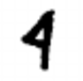
* We often need to analyze deep learning algorithms probabilistically.

 As a simple example, when we evaluate a classification model we often use its *accuracy*, which is after all the probability that the model will output the right answer given an example. More complicatedly we can ask questions such as "what's the probability that my algorithm will have accuracy X if I give it N examples to train on", as in [PAC learning](https://en.wikipedia.org/wiki/Probably_approximately_correct_learning), etc.

In my opinion, there is a crucial reason that is missing, however, which is simply that logic is *discrete* and probability is *continuous*. Take this picture for example, is it a dog or a cat?
![](http://www.catster.com/wp-content/uploads/2017/08/A-fluffy-cat-looking-funny-surprised-or-concerned.jpg)

I think we all agree that there is no probability involved here. This is definitely, 100% a cat, so the "very few things are certain" argument above shouldn't apply.

Indeed, I think it doesn't, but it is still important for our model to return a *probability* that something is a cat rather than a certainty, simply because probabilities are **continuous** and certainties are not: if our algorithm was outputing certainties and thought the picture above was a dog, it would be really hard to know how to change its parameter so that it outputs the right answer without also ruining its performance on the examples it does perform well on. By contrast, with probabilities there is a straightforward way to increase the probability that it gives to the picture being a cat, which we see in chapter 4.

#### Sources of uncertainty

The book gives 3 (or arguably 4) sources of uncertainty. I think it is possible to combine them into two:
* **"Real" stochasticity** ("stochasticity" is just a fancy word for "randomness"): Sometimes the world literally flips a coin, and you have to deal with that.

 One deep learning example is language modeling, in which a deep learning model needs to predict the next word given a list of previous words. If I give you the sentence "France is a...", can you predict what the next word is? No, because it could literally be any number of things: just on the Wikipidia page for France these words are followed alternatively by "country", "unitary", "developed", "founding", "member" and "permanent". 
 
 *The book differentiates between "inherent stochasticity" and "incomplete observability". IMO this is often not a useful distinction: if someone flips a coin, is the answer random because there are actual quantum processes deciding which side it ends up on or does it just seem random because we don't have information on the speed at which the coin rotates, the density of the molecules of air etc.? The answer is almost always: it doesn't matter.*
 
* **Incomplete modeling**: Sometimes you just can't model everything, or don't want to.

 Again taking the example of language modeling, the truth is that in spite of genuine recent progress, computers still can't understand language in the same way that humans can, and that sometimes means that humans can predict the next word in a sentence with 100% probability where no machine can yet. This means that our algorithms need to rely on outputing probabilities simply because they aren't quite good enough yet. Similarly, you might decide that modeling all the complexity involved in knowing something for certain is too high, and that you are ok being wrong some of the time. The example in the book is great for this: it is much cheaper to remember "most birds can fly" than "all birds can fly except sick, injured or very young birds, as well as kiwis, ostriches, emus etc.".

## Random Variables

A random variable is a "variable" whose value changes randomly.

From a code perspective, this doesn't make any sense, so you can think of a random variable as a function that takes no argument and returns a random value. Here's an example of a random variable X that is randomly 1 or 2.

In [2]:
def X():
    return random.choice([1, 2])

print(X())
print(X())
print(X())

2
1
1


So when I talk about the random variable X, am I talking about the function defined using `def X(): ...` or am I talking about the return value that I get by calling `X()`, you may ask?

The answer is: it depends. The truth is that mathematical notation is sloppy like that, but in practice it will generally be straightforward to figure out whether people are talking about `def X(): ...` or `X()`.

As a final note, if the random variable is used as a number in a mathematical expression, it normally isn't re-evaluated each time, so for instance: X < 1.5 and X > 0.5 means:

In [3]:
x = X()
x < 1.5 and x > 0.5

False

**not**

In [4]:
X() < 1.5 and X() > 0.5

True

Random variables can be *continuous* or *discrete*. Do **not** read the definition of continuous and discrete random variables, because it is wrong, and I don't mean "wrong" as in "a bit simplified", but more "wrong" as in "so simplified that people will mistakenly think that certain r.v.s are discrete when they are actually continuous, and that it completely misses the point of why there is a distinction in the first place".

Here is a simplified definition of both that I think preserves accuracy:

* A discrete random variable is a random variable that can return (aka "take on") only "disconnected" values. In other words, between any two numbers that it can return, there are other numbers (infinitely many in fact) that it cannot return.
 
 For instance our variable X above is discrete because it can only return 1 or 2, but not 1.5, 1.25, 1.58928921 or any of the other numbers between 1 and 2. Likewise, even a variable that can take on any of the following numbers: 0.5, 1, 1.5, 2, 2.5... and so on, is discrete, even though it has infinite possibilities.
* A continuous random variable can take on **any** of the values on one (or several) interval.

 For instance the variable Y below can take on any number between 0 and 1. Could it take on 0.03920? Yes. 0.23? Yes. etc.
 
The distinction is important for two reasons:
* Discrete random variables can be dealt with with regular arithmetic. Continuous random variables require calculus.
* All values that a discrete random variable can take on have a probability greater than 0. All values that a continuous random variable can take on have a probability... Equal to 0!

 Think about the variable Y below: every number between 0 and 1 has the same probability of being returned by Y... But how many numbers are there between 0 and 1? Infinity! So it is impossible that the probability for each number be greater than 0 because otherwise the total probability will sum to infinity.

In [5]:
# A continuous random variable.
def Y():
    return random.random()

Y()

0.9846753651916462

## Distributions, PMFs and PDFs

A distribution is a way of describing the probabilities of the different possible outputs of a random variable. A distribution can tell us what the probability is that a random variable will output a given value or a value in a given interval.

In Python, many distributions are supported in the `scipy.stats` module. We will explain a bit about how to explore that module here.

A discrete distribution has a probability **mass** function (PMF). It takes in a value and outputs a probability, so for instance if P is the PMF of our variable X above, you have P(1) = 0.5. Sometimes we write P(X = 1) so that we are sure that it is the PMF of X. 

If you graph this function, the x axis will show the different values it can take on, while the y axis will show the probability of that value. Of course, the sum of all the y values must be equal to 1 since the sum of probabilities for a random variable must be 1.

The discrete distributions supported by scipy are found [here](https://docs.scipy.org/doc/scipy/reference/tutorial/stats/discrete.html). This allows us to create random variables using known distributions, which is more convenient than writing our own function. One thing to note is that to sample from a r.v. we now need to call the `rvs()` function on the distribution object. For example, let's sample from a "binomial" distribution: 

In [6]:
X = scipy.stats.binom(4, 0.5)
print(X.rvs())

2


Because the values of the discrete r.v.s are disconnected, a PMF looks "spiky" like this:

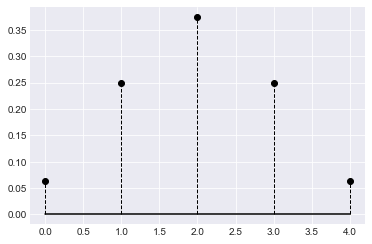

In [7]:
values = np.arange(0, 5)
probabilities = X.pmf(values)

markerline, stemlines, baseline = plt.stem(values, probabilities, markerfmt='ko', linefmt='k--', basefmt='k-')
plt.setp(stemlines, 'linewidth', 1)
plt.show()

There can be a PMF for multiple variables, in which case we call it a "joint PMF". So the PMF P(X = x, Y = y) gives the probability that X is equal to x and Y is equal to y. Often this is the same as the probability that X is equal to x **times** Y is equal to y, but not always (see after).

Here's what a joint PMF might look like:

In [8]:
def animate_3d(name, fig, ax, elev=40, fps=15):
    # see https://stackoverflow.com/questions/7821518/matplotlib-save-plot-to-numpy-array
    # and https://stackoverflow.com/questions/12904912/how-to-set-camera-position-for-3d-plots-using-python-matplotlib
    # and https://stackoverflow.com/questions/753190/programmatically-generate-video-or-animated-gif-in-python
    images = []
    #ax.set_axis_off()
    for i in range(0, 360, 4):
        ax.view_init(elev=elev, azim=i)
        fig.canvas.draw()
        data = np.fromstring(fig.canvas.tostring_rgb(), dtype=np.uint8, sep='')
        data = data.reshape(fig.canvas.get_width_height()[::-1] + (3,))
        images.append(data)
        
    imageio.mimsave(f'03_imgs/{name}.gif', images, fps=fps)
    display(Image(f'03_imgs/{name}.gif'))


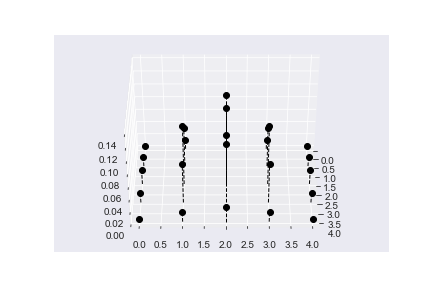

In [9]:
# See https://stackoverflow.com/questions/8453726/is-there-a-matplotlib-counterpart-of-matlab-stem3
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='3d')

joint_probabilities = np.outer(probabilities, probabilities)
for i, j in itertools.product(range(len(probabilities)), range(len(probabilities))):        
    xi = values[i]
    yi = values[j]
    zi = joint_probabilities[i, j]
    line=art3d.Line3D(*zip((xi, yi, 0), (xi, yi, zi)), marker='o', markevery=(1, 1), color='k', linewidth=1, linestyle='--')
    ax.add_line(line)
ax.set_xlim3d(np.min(values) - 0.1, np.max(values) + 0.1)
ax.set_ylim3d(np.min(values)- 0.1, np.max(values) + 0.1)
ax.set_zlim3d(0, np.max(joint_probabilities) + 0.001)    
animate_3d('pmf', fig, ax)
plt.close()


Continuous random variables, on the other hand, have probability **density** function. It is also a function of the values that the the r.v. can take, but it does **not** return the probability that a given value: as we've said, the probability is 0 for every possible value.

However, we might want to express the notion that values *near* 0 should be more likely than values *near* 2, for instance, even though both 0 and 2 have 0 probability. This is where the probability **density** function comes in: the value of the PDF *p* at *x* (*p(x)*) is proportional to the probability of getting a number that is within an *interval* very close to *x*.

Specifically it is defined so that the probability of the value falling within an interval is the area under the curve of the PDF in that interval. In other words, to get the probability of the value being in an interval you need to **integrate** the PDF over that interval, just like if you wanted to do the same with a discrete r.v. you would need to sum the values of the PMF in that interval: integrating is basically the continuous equivalent of summing.

Sadly, unlike summing, integrating by hand is pretty hard. Fortunately, there are two ways to easily get integrals thanks to modern software:
* Using [Wolfram Alpha](https://www.wolframalpha.com), you can often get an exact, analytic solution for your integral: simply write "[integrate 2x+1 from 0.1 to 0.8](https://www.wolframalpha.com/input/?i=integrate+2x%2B1+from+0.1+to+0.8)", for instance, and Wolfram Alpha will tell you the exact answer, which is 1.33.
* Using scipy in python: you can use `scipy.integrate.quad`. The first value it returns is the integral and the second can be ignored (it's an estimate of how much error there might be in the answer, since integrating numerically is an approximate process).

The continuous distributions in scipy can be found [here](https://docs.scipy.org/doc/scipy/reference/tutorial/stats/continuous.html). Let's redefine the r.v. Y above, which as you will recall was uniformly distributed from 0 to 1:

In [10]:
Y = scipy.stats.uniform()
Y.rvs()

0.74082955124010941

As we recall, Y is a continuous random variable for which all values from 0 to 1 have equal probability of being chosen and all values outside have 0 probability. Let's show what this looks like in terms of its PDF:

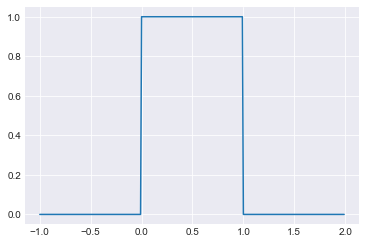

In [11]:
x = np.arange(-1, 2, 0.01)
y = Y.pdf(x)
plt.plot(x, y)
plt.show()

We would expect that the probability that Y returns a number between 0.3 and 0.4 would be 0.1 since that interval covers 10% of the allowable range. Likewise, clearly the probability that the value falls between 0 and 1 must be 1, and indeed the probability that it falls between -1 and 2 must also be 1.

Let's check by integrating:

In [12]:
def p_prob(name, val):
    print(f'P({name}) = {val:.2f}')

p_prob('Y > 0.3 & Y < 0.4', scipy.integrate.quad(Y.pdf, 0.3, 0.4)[0])
p_prob('Y > 0 & Y < 1', scipy.integrate.quad(Y.pdf, 0, 1)[0])
p_prob('Y > -1 & Y < 2', scipy.integrate.quad(Y.pdf, -1, 2)[0])

P(Y > 0.3 & Y < 0.4) = 0.10
P(Y > 0 & Y < 1) = 1.00
P(Y > -1 & Y < 2) = 1.00


Just like with PMFs, a PDF can relate to two different random variables. We then call it a "joint PDF". Here's an example below:

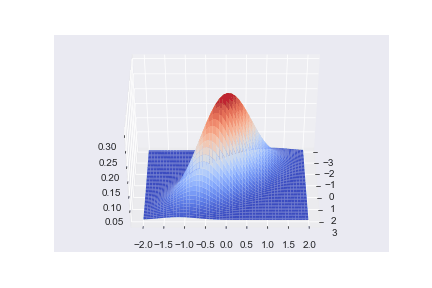

In [13]:
scipy.stats.random_correlation.rvs([0.3, 1.7])

Z = scipy.stats.multivariate_normal(
    mean=[0.0, 0.0],
    cov=[[1.3, -0.5], [-0.5, 0.4]]
)

x, y = np.mgrid[-3:3:0.01, -2:2:0.01]
pos = np.dstack((x, y))

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='3d')

ax.plot_surface(
    X=x, Y=y, Z=Z.pdf(pos), 
    cmap='coolwarm', rcount=50, ccount=50
)
animate_3d('pdf', fig, ax)
plt.close()

# Marginalization

What if you are given a joint PMF and want to know the PMF or PDF corresponding to a single variable? In other words, you know P(X=x, Y=y) and want to know just P(X=x).

Logically, it seems like the probability that X = x ignoring Y should be the probability that X=x *and* Y=0 (or whatever the first possible value of Y is) plus the probability that X=x *and* Y=1 etc. for all the possible values of Y. In other words, we take the **sum** of P(X=x, Y=y) for all possible y. In math:

$$P(X=x) = \sum_y P(X=x, Y=y)$$

This process is indeed correct and is called **marginalization**. The resulting distribution of X is called the **marginal distribution**. Let's see what it looks like for a PMF, as a reminder, we have a set of joint probabilities in our `join_probabilities` variable:

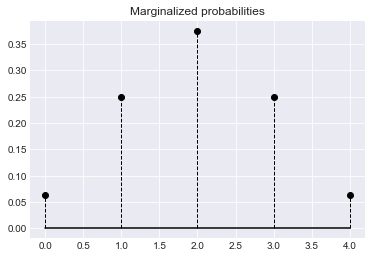

In [14]:
new_probabilities = np.sum(joint_probabilities, axis=0)

markerline, stemlines, baseline = plt.stem(values, new_probabilities, markerfmt='ko', linefmt='k--', basefmt='k-')
plt.setp(stemlines, 'linewidth', 1)
plt.title('Marginalized probabilities')
plt.show()

In this case we recovered the original PMF we showed for X, because `joint_probabilities` contained the probabilities for independent variables. This will not necessarily always be the case.

Marginalization also works for PDFs, and again the only difference is that we need to use integration over all possible ys instead of sum, ie:

$$p(x) = \int_{-\infty}^{\infty} p(x, y) dy$$

Let's see what it looks like when we marginalize for X in our previous continous join PDF:

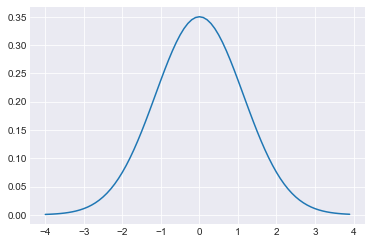

In [15]:
def Z_pdf_fixed_x(x):
    def pdf(y):
        return Z.pdf([x, y])
    return pdf

# Close enough to infinity for our purposes
INF = 100
    
values = np.arange(-4, 4, 0.1)
probs = [scipy.integrate.quad(Z_pdf_fixed_x(x), -INF, INF)[0] for x in values]

plt.plot(values, probs)
plt.show()


Perhaps a way to view marginalization is as a form of "squashing": imagine compressing the 3D pictures you saw above along the y axis, pushing the probability mass on top of itself until the 3D graph is completely flattened, leaving just the original x axis. 

Of course, since you can have joint distributions of more than two variables, this visualization only goes so far, but remember our quote from last time:

> To deal with a 14-dimensional space, visualize a 3-D space and say 'fourteen' to yourself very loudly. Everyone does it.

> *Geoffrey Hinton*


# Conditional Probability

Marginalization allows us to get the distribution of variable X ignoring variable Y from the joint distribution of X and Y, but what if we want to know the distribution of X given a *specific* value of Y?

This probability is called the *conditional* probability of X given Y, and is denoted like so:

$$P(X = x | Y = y)$$

The vertical bar is usually pronounced "given" in this case.

To give a specific example, suppose you want to know whether someone comes from Germany, and you know that they speak fluent German. You are given the following joint PMF showing the proportion of the world that speaks German and lives in Germany:


In [16]:
german_df = pd.DataFrame({
    'Country': ['Germany', 'Other'],
    'Yes': np.array([80, 15]) / 7500,
    'No': np.array([2, 7500-80-15-2]) / 7500},
    columns=['Country', 'Yes', 'No']
).set_index('Country')
german_df

,Yes,No
Country,,
Germany,0.010667,0.000267
Other,0.002000,0.987067


How do you know the probability that someone who speaks German is from Germany? Well it seems like you need to know how many people in the world speak German as well as how many people there are in Germany in total. Indeed, you don't need the actual count of people in either case, the proportion of the world population will suffice. In other words:
$$P(Country=Germany \: | \: German=Yes) = \frac{P(German=Yes, Country=Germany)}{P(German=Yes)}$$

The way we get the denominator is of course using *marginalization* as described above, ie by summing the languages of everybody who lives in Germany.

We get:

In [17]:
german_df.loc['Germany', 'Yes'] / german_df.loc[:, 'Yes'].sum()

0.84210526315789469

A 84.2% chance, which is not surprising of course, since Germany is such a large German speaking country.

As you might guess, the general rule is as follows:

$$P(X=x | Y=y) = \frac{P(X=x, Y=y)}{P(Y=y)}$$

Applying this rule to all possible values of X gives us a new distribution called the **conditional distribution** of X given Y. 

Similar to how we said marginalization can be thought of as "squishing" the graph of the joint distribution, taking the conditional distribution is similar to **slicing** the graph, and then *renormalizing* it so that the final distribution still sums to 1. Let's "slice" our 3D joint PDF from before along Y = 1.0:

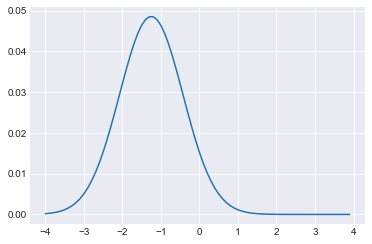

In [18]:
probs = np.array([Z.pdf([x, 1.0]) for x in values])
probs = probs / np.sum(probs)

plt.plot(values, probs)
plt.show()


It is important to not confuse a conditional probability with something that is actually actionable. In our Germany example, it is clear that teaching someone German will not make them any more likely to *be* from Germany, but often this pitfall is not so obvious.

![](https://imgs.xkcd.com/comics/correlation.png)

## Chain Rule of Conditional Probability

We now know how to go from a joint distribution to an marginal distribution and from a joint and marginal distribution to a conditional distribution. Let's now complete the cycle by going from a marginal and conditional distribution to a joint distribution. 

The process is very simple, again. Suppose you know the probability that someone is German given that they speak German and also the probability that someone anywhere in the world speaks German and you want to know the probability that someone is both German and speaks German. It seems like you need to simply multiply the conditional and marginal probability:
$$P(German=Yes, Country=Germany) = P(Country=Germany \: | \: German=Yes)P(German=Yes)$$

Indeed, this follow directly from the definitior of conditional probability above.

In general:
$$P(x, y) = P(x | y) P(y)$$

## Bayes' Rule

Finally suppose you don't want to know the probability that your friend is German given than he speaks German but rather the probability that someone speaks German given that they are from Germany. 

Of course, we could do it with the full joint PMF table from before, but unfortunately we don't always have access to those. Suppose we know the probability from above (that someone who speaks German is from Germany) as well as the probability that someone anywhere in the world is German and the probability that someone in the world *speaks* German. Can we figure it out?

Of course, we just need to recover the joint probability, which we did above, and then divide by the proportion of people who are from Germany.

In general, we have:
$$P(y|x) = \frac{P(x, y)}{P(x)}$$
(from the definition of conditional probability)

So:
$$P(y|x) = \frac{P(x|y)P(y)}{P(x)}$$
(from the chain rule of conditional probability).

This last equation is famously known as **Bayes' rule**. It is very useful in any number of situations, though as you can see, in spite of its fancy name, it is just a straightforward application of our definitions.

# Final Words

The above covers only about half of chapter 3. This took a lot longer to write than I expected and I think we have reached a good natural break in the material (the rest is more of a grab-bag of various fun techniques), so I will finish my notes for chapter 3 in a subsequent post. See you soon!